# Python DSP Preset Optimization: Latency Profiling\n\nCompares the original and optimized versions of each ConjureDSP Python preset.\nEach preset's `process()` function is called on the real-time audio thread — any\nlatency spike is a potential audio glitch.

In [1]:
import importlib.util
import gc
import time
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pathlib import Path

PRESETS = [
    "bitcrush", "compressor", "gainpan", "hardclip", "limiter",
    "noisegate", "ringmod", "softclip", "stereowidth", "tremolo", "wavefolder",
]

FRAME_COUNT = 512
SAMPLE_RATE = 44100.0
N_ITER = 50_000
WARMUP = 2_000

BUDGET_US = (FRAME_COUNT / SAMPLE_RATE) * 1e6  # real-time deadline in microseconds

np.random.seed(42)
noise = (np.random.randn(FRAME_COUNT) * 0.3).astype(np.float32)

def load_preset(path):
    spec = importlib.util.spec_from_file_location(Path(path).stem, path)
    mod = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(mod)
    return mod

def benchmark(mod):
    params = {k: v["default"] for k, v in mod.PARAMS.items()}
    inp = [noise.copy(), noise.copy()]
    out = [np.zeros(FRAME_COUNT, dtype=np.float32), np.zeros(FRAME_COUNT, dtype=np.float32)]

    for _ in range(WARMUP):
        mod.process(inp, out, FRAME_COUNT, SAMPLE_RATE, params)

    # GC stays enabled — this is the realistic scenario.
    # The optimization reduces GC pressure from temporary arrays,
    # so disabling GC would hide the effect we're measuring.
    gc.collect()

    times = []
    for _ in range(N_ITER):
        np.copyto(inp[0], noise)
        np.copyto(inp[1], noise)
        t0 = time.perf_counter()
        mod.process(inp, out, FRAME_COUNT, SAMPLE_RATE, params)
        t1 = time.perf_counter()
        times.append((t1 - t0) * 1e6)

    return np.array(times)

print(f"Buffer: {FRAME_COUNT} samples @ {SAMPLE_RATE/1000:.1f} kHz = {BUDGET_US:.0f} us real-time budget")
print(f"Iterations: {N_ITER:,} per preset per version")
print(f"Warmup: {WARMUP:,} iterations")
print(f"GC: enabled (realistic conditions)")

Buffer: 512 samples @ 44.1 kHz = 11610 us real-time budget
Iterations: 50,000 per preset per version
Warmup: 2,000 iterations
GC: enabled (realistic conditions)


In [2]:
results = {}

for name in PRESETS:
    print(f"Benchmarking {name}...", end=" ", flush=True)
    
    old_mod = load_preset(f"original/preset_{name}.py")
    old_times = benchmark(old_mod)
    
    new_mod = load_preset(f"optimized/preset_{name}.py")
    new_times = benchmark(new_mod)
    
    results[name] = {"original": old_times, "optimized": new_times}
    
    old_med = np.median(old_times)
    new_med = np.median(new_times)
    pct = (new_med - old_med) / old_med * 100
    print(f"median: {old_med:.1f} -> {new_med:.1f} us ({pct:+.1f}%)")

print(f"\nDone. {len(results)} presets profiled.")

Benchmarking bitcrush... median: 103.0 -> 103.2 us (+0.1%)
Benchmarking compressor... median: 679.4 -> 693.3 us (+2.0%)
Benchmarking gainpan... median: 2.1 -> 1.7 us (-18.0%)
Benchmarking hardclip... median: 5.6 -> 5.8 us (+3.7%)
Benchmarking limiter... median: 336.5 -> 336.5 us (-0.0%)
Benchmarking noisegate... median: 277.2 -> 279.0 us (+0.6%)
Benchmarking ringmod... median: 5.1 -> 4.8 us (-5.7%)
Benchmarking softclip... median: 6.1 -> 7.2 us (+17.7%)
Benchmarking stereowidth... median: 3.9 -> 3.5 us (-10.6%)
Benchmarking tremolo... median: 6.8 -> 6.5 us (-3.7%)
Benchmarking wavefolder... median: 10.0 -> 9.9 us (-1.2%)

Done. 11 presets profiled.


In [9]:
import csv

results = {}
with open("raw_timings.csv", "r") as f:
    reader = csv.DictReader(f)
    for row in reader:
        name = row["preset"]
        version = row["version"]
        if name not in results:
            results[name] = {"original": [], "optimized": []}
        results[name][version].append(float(row["duration_us"]))

for name in results:
    results[name]["original"] = np.array(results[name]["original"])
    results[name]["optimized"] = np.array(results[name]["optimized"])

print(f"Loaded {len(results)} presets from raw_timings.csv")


Loaded 11 presets from raw_timings.csv


## Per-Preset Latency Histograms

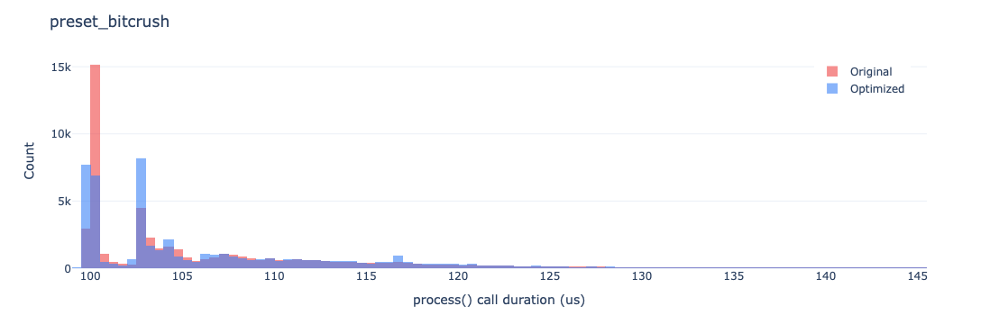

  Median:    103.04 ->   103.17 us  (+0.1%)
  P99:       136.54 ->   132.92 us  (-2.7%)
  P99.9:     201.92 ->   184.67 us  (-8.5%)
  Max:       501.83 ->   301.38 us  (-39.9%)
  Budget:  11610 us  (median uses 0.89%)



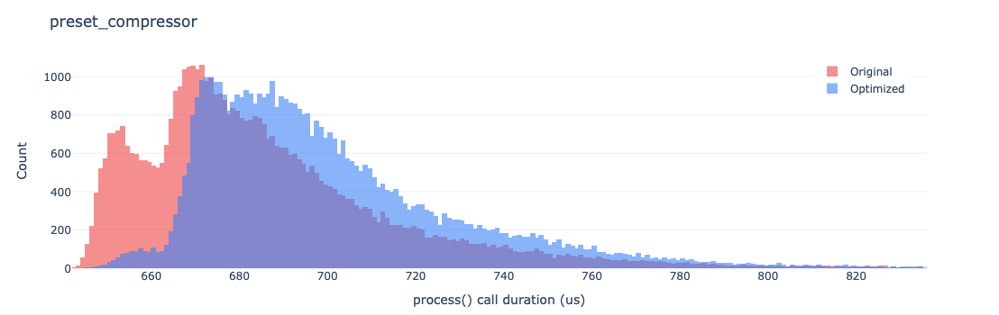

  Median:    679.42 ->   693.33 us  (+2.0%)
  P99:       797.67 ->   809.13 us  (+1.4%)
  P99.9:     945.84 ->  1898.56 us  (+100.7%)
  Max:      3940.79 ->  7297.88 us  (+85.2%)
  Budget:  11610 us  (median uses 5.97%)



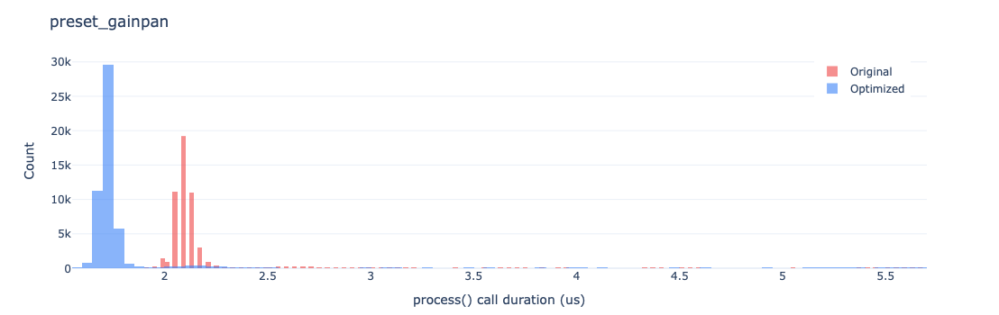

  Median:      2.08 ->     1.71 us  (-18.0%)
  P99:         2.83 ->     2.29 us  (-19.1%)
  P99.9:      11.58 ->     9.58 us  (-17.3%)
  Max:        38.67 ->    37.87 us  (-2.0%)
  Budget:  11610 us  (median uses 0.01%)



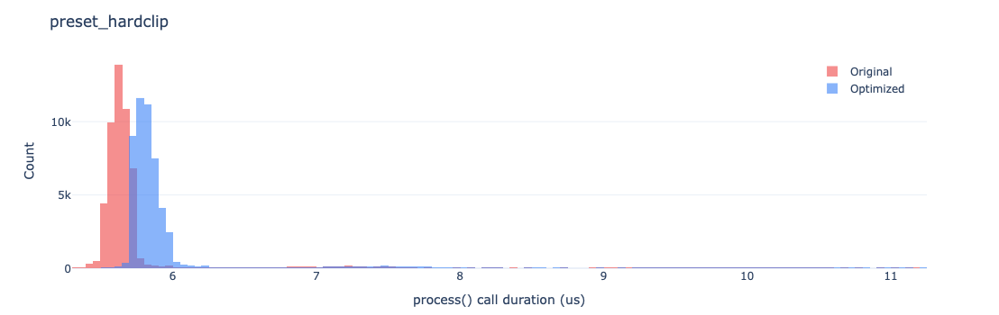

  Median:      5.63 ->     5.83 us  (+3.7%)
  P99:         7.54 ->    10.13 us  (+34.2%)
  P99.9:      16.00 ->    17.04 us  (+6.5%)
  Max:        46.08 ->   121.58 us  (+163.8%)
  Budget:  11610 us  (median uses 0.05%)



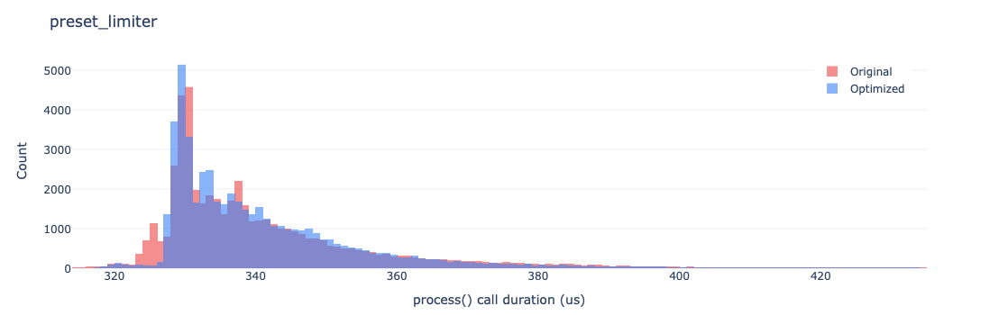

  Median:    336.54 ->   336.52 us  (-0.0%)
  P99:       410.59 ->   396.46 us  (-3.4%)
  P99.9:     866.05 ->   578.38 us  (-33.2%)
  Max:      3125.75 ->  2416.29 us  (-22.7%)
  Budget:  11610 us  (median uses 2.90%)



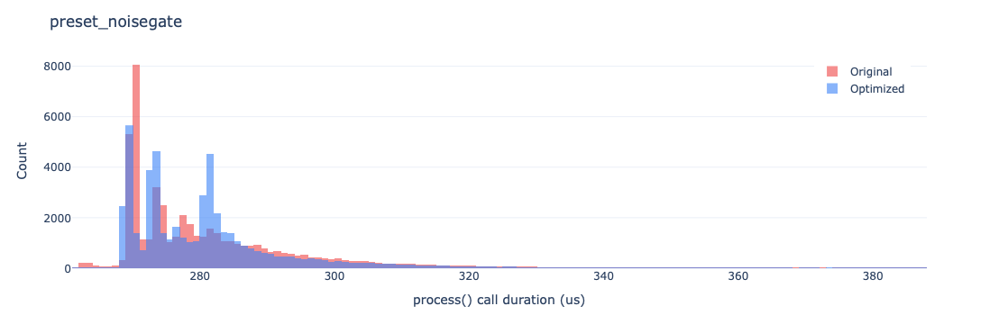

  Median:    277.25 ->   279.00 us  (+0.6%)
  P99:       338.79 ->   343.04 us  (+1.3%)
  P99.9:     609.67 ->   763.34 us  (+25.2%)
  Max:      2733.46 ->  4439.21 us  (+62.4%)
  Budget:  11610 us  (median uses 2.40%)



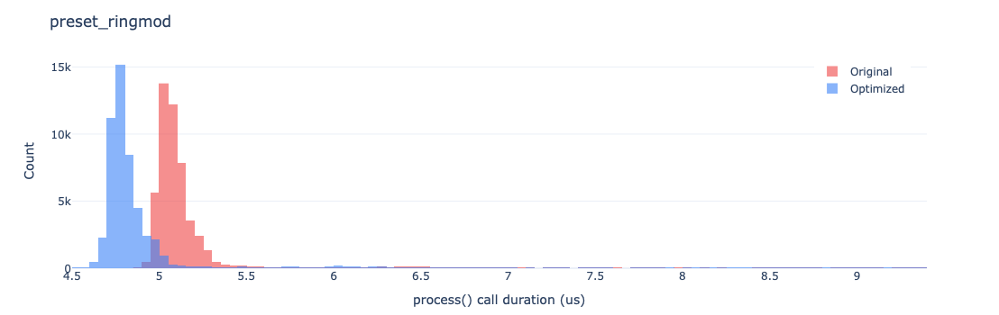

  Median:      5.08 ->     4.79 us  (-5.7%)
  P99:         6.71 ->     6.42 us  (-4.3%)
  P99.9:      19.42 ->    17.08 us  (-12.0%)
  Max:       124.04 ->   115.71 us  (-6.7%)
  Budget:  11610 us  (median uses 0.04%)



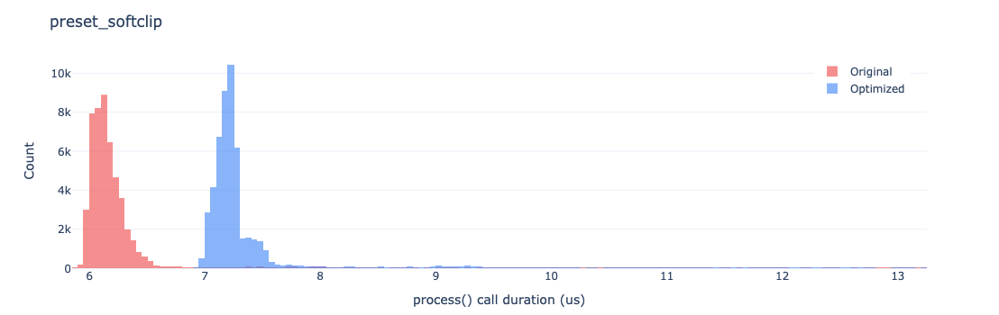

  Median:      6.12 ->     7.21 us  (+17.7%)
  P99:         9.50 ->    11.21 us  (+18.0%)
  P99.9:      26.50 ->    26.33 us  (-0.6%)
  Max:       156.00 ->   131.17 us  (-15.9%)
  Budget:  11610 us  (median uses 0.06%)



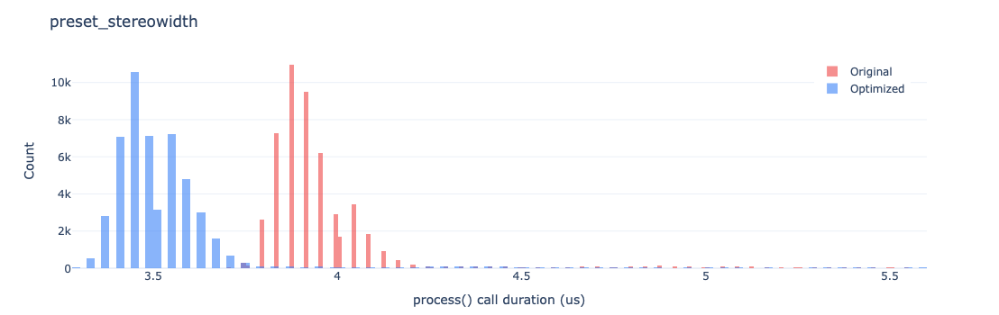

  Median:      3.92 ->     3.50 us  (-10.6%)
  P99:         5.13 ->     4.46 us  (-13.0%)
  P99.9:      15.71 ->    13.04 us  (-17.0%)
  Max:        64.87 ->    69.92 us  (+7.8%)
  Budget:  11610 us  (median uses 0.03%)



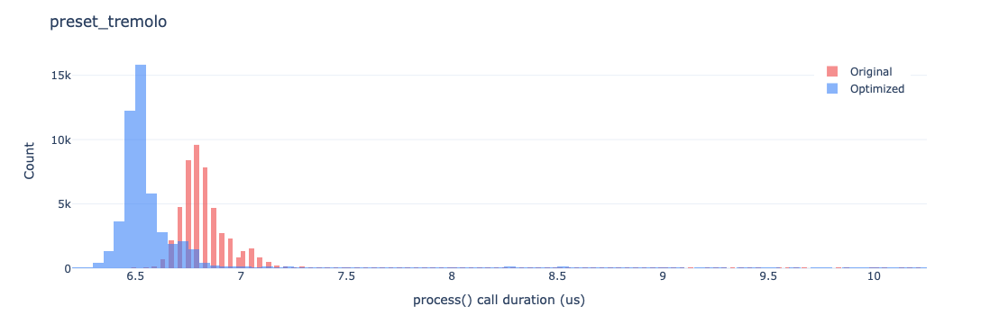

  Median:      6.79 ->     6.54 us  (-3.7%)
  P99:         8.71 ->     8.46 us  (-2.9%)
  P99.9:      20.17 ->    17.79 us  (-11.8%)
  Max:       123.29 ->   111.83 us  (-9.3%)
  Budget:  11610 us  (median uses 0.06%)



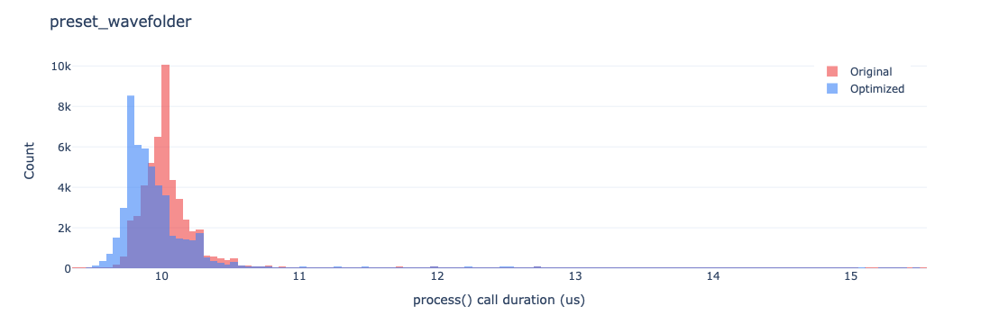

  Median:     10.00 ->     9.88 us  (-1.2%)
  P99:        13.54 ->    12.71 us  (-6.2%)
  P99.9:      26.75 ->    30.92 us  (+15.6%)
  Max:       132.12 ->   129.25 us  (-2.2%)
  Budget:  11610 us  (median uses 0.09%)



In [3]:
for name in PRESETS:
    old = results[name]["original"]
    new = results[name]["optimized"]

    old_med = np.median(old)
    new_med = np.median(new)
    old_p99 = np.percentile(old, 99)
    new_p99 = np.percentile(new, 99)
    old_p999 = np.percentile(old, 99.9)
    new_p999 = np.percentile(new, 99.9)
    old_max = np.max(old)
    new_max = np.max(new)

    # Clip histogram range to 99.5th percentile for readability
    clip = np.percentile(np.concatenate([old, new]), 99.5)

    fig = go.Figure()
    fig.add_trace(go.Histogram(
        x=old[old <= clip], name="Original",
        opacity=0.6, marker_color="#ef4444",
        nbinsx=200,
    ))
    fig.add_trace(go.Histogram(
        x=new[new <= clip], name="Optimized",
        opacity=0.6, marker_color="#3b82f6",
        nbinsx=200,
    ))

    fig.update_layout(
        title=f"preset_{name}",
        xaxis_title="process() call duration (us)",
        yaxis_title="Count",
        barmode="overlay",
        template="plotly_white",
        height=350,
        margin=dict(t=60, b=50),
        legend=dict(x=0.98, y=0.98, xanchor="right"),
    )

    fig.show()

    med_pct = (new_med - old_med) / old_med * 100
    p99_pct = (new_p99 - old_p99) / old_p99 * 100
    p999_pct = (new_p999 - old_p999) / old_p999 * 100
    max_pct = (new_max - old_max) / old_max * 100

    print(f"  Median:  {old_med:>8.2f} -> {new_med:>8.2f} us  ({med_pct:+.1f}%)")
    print(f"  P99:     {old_p99:>8.2f} -> {new_p99:>8.2f} us  ({p99_pct:+.1f}%)")
    print(f"  P99.9:   {old_p999:>8.2f} -> {new_p999:>8.2f} us  ({p999_pct:+.1f}%)")
    print(f"  Max:     {old_max:>8.2f} -> {new_max:>8.2f} us  ({max_pct:+.1f}%)")
    print(f"  Budget:  {BUDGET_US:.0f} us  (median uses {new_med/BUDGET_US*100:.2f}%)")
    print()

## Summary

In [4]:
# Summary table sorted by median duration (slowest first)
rows = []
for name in PRESETS:
    old = results[name]["original"]
    new = results[name]["optimized"]
    rows.append({
        "name": name,
        "old_med": np.median(old),
        "new_med": np.median(new),
        "old_p99": np.percentile(old, 99),
        "new_p99": np.percentile(new, 99),
        "old_p999": np.percentile(old, 99.9),
        "new_p999": np.percentile(new, 99.9),
        "old_max": np.max(old),
        "new_max": np.max(new),
    })

rows.sort(key=lambda r: r["old_med"], reverse=True)

print(f"{'Preset':<16} {'Median (us)':>22} {'P99 (us)':>22} {'P99.9 (us)':>22} {'Max (us)':>22}")
print(f"{'':16} {'orig':>8} {'opt':>8} {'chg':>6} {'orig':>8} {'opt':>8} {'chg':>6} {'orig':>8} {'opt':>8} {'chg':>6} {'orig':>8} {'opt':>8} {'chg':>6}")
print("-" * 110)

for r in rows:
    med_pct = (r["new_med"] - r["old_med"]) / r["old_med"] * 100
    p99_pct = (r["new_p99"] - r["old_p99"]) / r["old_p99"] * 100
    p999_pct = (r["new_p999"] - r["old_p999"]) / r["old_p999"] * 100
    max_pct = (r["new_max"] - r["old_max"]) / r["old_max"] * 100
    print(f"{r['name']:<16} {r['old_med']:>8.1f} {r['new_med']:>8.1f} {med_pct:>+5.1f}% {r['old_p99']:>8.1f} {r['new_p99']:>8.1f} {p99_pct:>+5.1f}% {r['old_p999']:>8.1f} {r['new_p999']:>8.1f} {p999_pct:>+5.1f}% {r['old_max']:>8.1f} {r['new_max']:>8.1f} {max_pct:>+5.1f}%")

Preset                      Median (us)               P99 (us)             P99.9 (us)               Max (us)
                     orig      opt    chg     orig      opt    chg     orig      opt    chg     orig      opt    chg
--------------------------------------------------------------------------------------------------------------
compressor          679.4    693.3  +2.0%    797.7    809.1  +1.4%    945.8   1898.6 +100.7%   3940.8   7297.9 +85.2%
limiter             336.5    336.5  -0.0%    410.6    396.5  -3.4%    866.1    578.4 -33.2%   3125.7   2416.3 -22.7%
noisegate           277.2    279.0  +0.6%    338.8    343.0  +1.3%    609.7    763.3 +25.2%   2733.5   4439.2 +62.4%
bitcrush            103.0    103.2  +0.1%    136.5    132.9  -2.7%    201.9    184.7  -8.5%    501.8    301.4 -39.9%
wavefolder           10.0      9.9  -1.2%     13.5     12.7  -6.2%     26.8     30.9 +15.6%    132.1    129.2  -2.2%
tremolo               6.8      6.5  -3.7%      8.7      8.5  -2.9%     20.2  

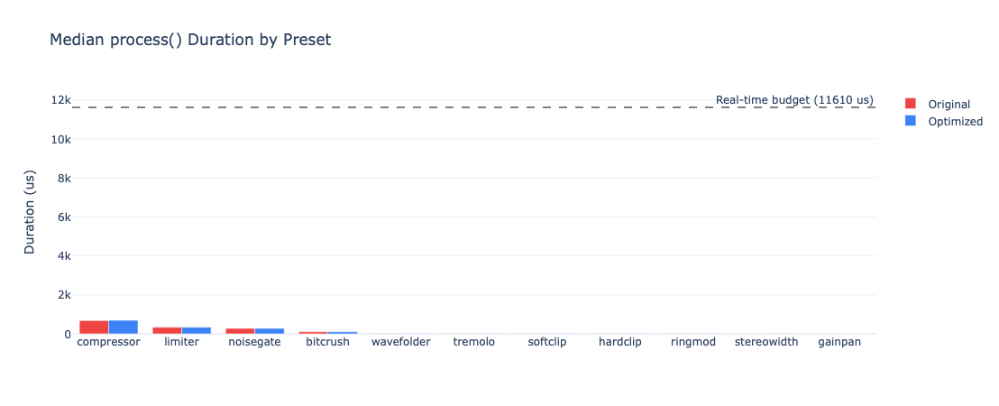

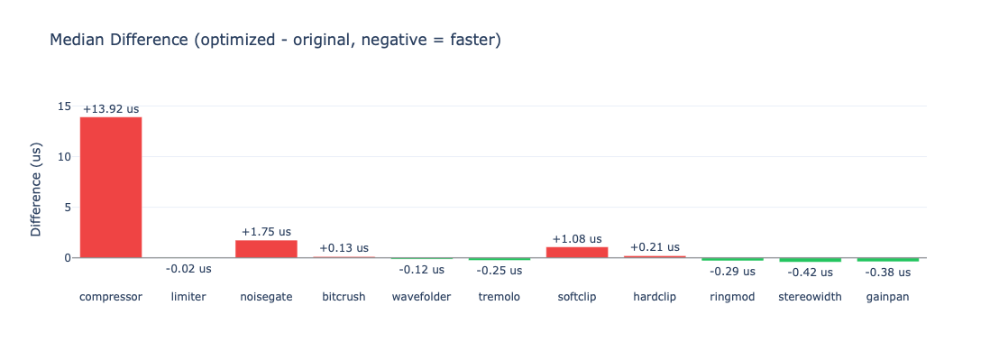

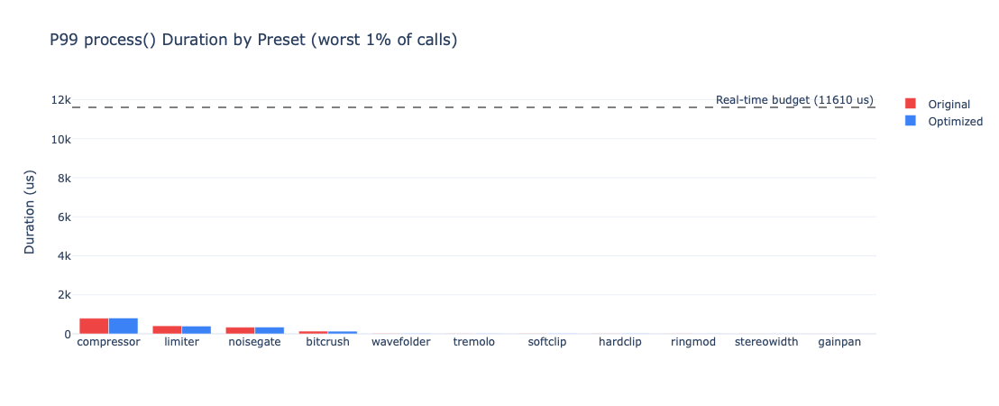

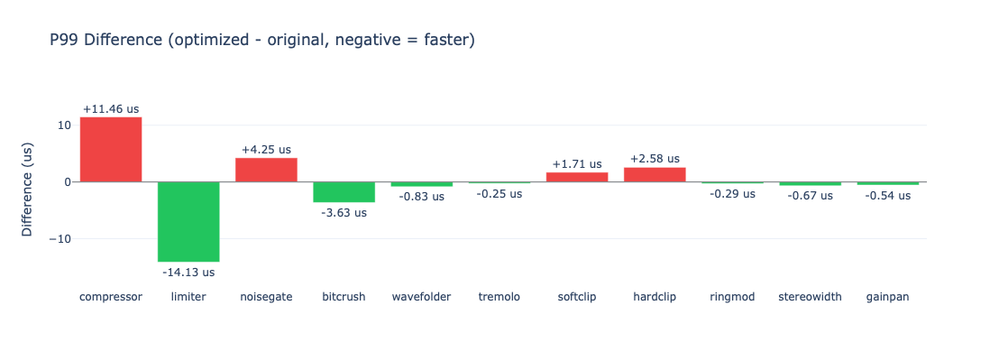

In [5]:
# Combined overlay: all presets, original vs optimized medians
names = [r["name"] for r in rows]
old_meds = [r["old_med"] for r in rows]
new_meds = [r["new_med"] for r in rows]

fig = go.Figure()
fig.add_trace(go.Bar(x=names, y=old_meds, name="Original", marker_color="#ef4444"))
fig.add_trace(go.Bar(x=names, y=new_meds, name="Optimized", marker_color="#3b82f6"))
fig.add_hline(y=BUDGET_US, line_dash="dash", line_color="gray",
              annotation_text=f"Real-time budget ({BUDGET_US:.0f} us)")

fig.update_layout(
    title="Median process() Duration by Preset",
    yaxis_title="Duration (us)",
    barmode="group",
    template="plotly_white",
    height=450,
)
fig.show()

# Median difference
med_diffs = [new - old for old, new in zip(old_meds, new_meds)]
med_colors = ["#22c55e" if d < 0 else "#ef4444" for d in med_diffs]

fig_diff = go.Figure()
fig_diff.add_trace(go.Bar(
    x=names, y=med_diffs,
    marker_color=med_colors,
    text=[f"{d:+.2f} us" for d in med_diffs],
    textposition="outside",
))
fig_diff.add_hline(y=0, line_color="gray", line_width=1)
fig_diff.update_layout(
    title="Median Difference (optimized - original, negative = faster)",
    yaxis_title="Difference (us)",
    template="plotly_white",
    height=400,
    showlegend=False,
)
fig_diff.show()

# P99 comparison
old_p99s = [r["old_p99"] for r in rows]
new_p99s = [r["new_p99"] for r in rows]

fig2 = go.Figure()
fig2.add_trace(go.Bar(x=names, y=old_p99s, name="Original", marker_color="#ef4444"))
fig2.add_trace(go.Bar(x=names, y=new_p99s, name="Optimized", marker_color="#3b82f6"))
fig2.add_hline(y=BUDGET_US, line_dash="dash", line_color="gray",
               annotation_text=f"Real-time budget ({BUDGET_US:.0f} us)")

fig2.update_layout(
    title="P99 process() Duration by Preset (worst 1% of calls)",
    yaxis_title="Duration (us)",
    barmode="group",
    template="plotly_white",
    height=450,
)
fig2.show()

# P99 difference
p99_diffs = [new - old for old, new in zip(old_p99s, new_p99s)]
p99_colors = ["#22c55e" if d < 0 else "#ef4444" for d in p99_diffs]

fig2_diff = go.Figure()
fig2_diff.add_trace(go.Bar(
    x=names, y=p99_diffs,
    marker_color=p99_colors,
    text=[f"{d:+.2f} us" for d in p99_diffs],
    textposition="outside",
))
fig2_diff.add_hline(y=0, line_color="gray", line_width=1)
fig2_diff.update_layout(
    title="P99 Difference (optimized - original, negative = faster)",
    yaxis_title="Difference (us)",
    template="plotly_white",
    height=400,
    showlegend=False,
)
fig2_diff.show()

In [7]:
# What fraction of the real-time budget does each preset consume?
print(f"Real-time budget: {BUDGET_US:.0f} us ({FRAME_COUNT} samples @ {SAMPLE_RATE/1000:.1f} kHz)\n")
print(f"{'Preset':<16} {'Median':>10} {'P99':>10} {'P99.9':>10} {'Max':>10}")
print("-" * 58)
for r in rows:
    print(f"{r['name']:<16} {r['new_med']/BUDGET_US*100:>9.2f}% {r['new_p99']/BUDGET_US*100:>9.2f}% {r['new_p999']/BUDGET_US*100:>9.2f}% {r['new_max']/BUDGET_US*100:>9.1f}%")

all_old = np.concatenate([results[n]["original"] for n in PRESETS])
all_new = np.concatenate([results[n]["optimized"] for n in PRESETS])
print(f"\nAcross all {len(PRESETS)} presets ({N_ITER * len(PRESETS):,} total calls each):")
print(f"  Original  - median: {np.median(all_old):.1f} us, p99: {np.percentile(all_old, 99):.1f} us, p99.9: {np.percentile(all_old, 99.9):.1f} us, max: {np.max(all_old):.1f} us")
print(f"  Optimized - median: {np.median(all_new):.1f} us, p99: {np.percentile(all_new, 99):.1f} us, p99.9: {np.percentile(all_new, 99.9):.1f} us, max: {np.max(all_new):.1f} us")

Real-time budget: 11610 us (512 samples @ 44.1 kHz)

Preset               Median        P99      P99.9        Max
----------------------------------------------------------
compressor            5.97%      6.97%     16.35%      62.9%
limiter               2.90%      3.41%      4.98%      20.8%
noisegate             2.40%      2.95%      6.57%      38.2%
bitcrush              0.89%      1.14%      1.59%       2.6%
wavefolder            0.09%      0.11%      0.27%       1.1%
tremolo               0.06%      0.07%      0.15%       1.0%
softclip              0.06%      0.10%      0.23%       1.1%
hardclip              0.05%      0.09%      0.15%       1.0%
ringmod               0.04%      0.06%      0.15%       1.0%
stereowidth           0.03%      0.04%      0.11%       0.6%
gainpan               0.01%      0.02%      0.08%       0.3%

Across all 11 presets (550,000 total calls each):
  Original  - median: 6.8 us, p99: 723.1 us, p99.9: 800.1 us, max: 3940.8 us
  Optimized - median: 7.2 us

In [8]:
import csv

# Save raw timing data
with open("raw_timings.csv", "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(["preset", "version", "iteration", "duration_us"])
    for name in PRESETS:
        for i, t in enumerate(results[name]["original"]):
            writer.writerow([name, "original", i, t])
        for i, t in enumerate(results[name]["optimized"]):
            writer.writerow([name, "optimized", i, t])

print(f"Saved {sum(len(results[n]['original']) + len(results[n]['optimized']) for n in PRESETS):,} rows to raw_timings.csv")


Saved 1,100,000 rows to raw_timings.csv
